<a href="https://colab.research.google.com/github/microsoft/qlib/blob/main/examples/workflow_by_code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#  Copyright (c) Microsoft Corporation.
#  Licensed under the MIT License.

In [2]:
import sys, site
from pathlib import Path

################################# NOTE #################################
#  Please be aware that if colab installs the latest numpy and pyqlib  #
#  in this cell, users should RESTART the runtime in order to run the  #
#  following cells successfully.                                       #
########################################################################

try:
    import qlib
except ImportError:
    # install qlib
    ! pip install --upgrade numpy
    ! pip install pyqlib
    if 'google.colab' in sys.modules:
        # The Google colab environment is a little outdated. We have to downgrade the pyyaml to make it compatible with other packages
        ! pip install pyyaml==5.4.1
    # reload
    site.main()

scripts_dir = Path.cwd().parent.joinpath("scripts")
if not scripts_dir.joinpath("get_data.py").exists():
    # download get_data.py script
    scripts_dir = Path("~/tmp/qlib_code/scripts").expanduser().resolve()
    scripts_dir.mkdir(parents=True, exist_ok=True)
    import requests
    with requests.get("https://raw.githubusercontent.com/microsoft/qlib/main/scripts/get_data.py") as resp:
        with open(scripts_dir.joinpath("get_data.py"), "wb") as fp:
            fp.write(resp.content)

In [3]:

import qlib
import pandas as pd
from qlib.constant import REG_CN
from qlib.utils import exists_qlib_data, init_instance_by_config
from qlib.workflow import R
from qlib.workflow.record_temp import SignalRecord, PortAnaRecord
from qlib.utils import flatten_dict


In [4]:
# use default data
# NOTE: need to download data from remote: python scripts/get_data.py qlib_data_cn --target_dir ~/.qlib/qlib_data/cn_data
provider_uri = "~/.qlib/qlib_data/cn_data"  # target_dir
if not exists_qlib_data(provider_uri):
    print(f"Qlib data is not found in {provider_uri}")
    sys.path.append(str(scripts_dir))
    from get_data import GetData
    GetData().qlib_data(target_dir=provider_uri, region=REG_CN)
qlib.init(provider_uri=provider_uri, region=REG_CN)

[507:MainThread](2022-09-26 16:02:32,179) INFO - qlib.Initialization - [config.py:413] - default_conf: client.
[507:MainThread](2022-09-26 16:02:32,184) INFO - qlib.workflow - [expm.py:31] - experiment manager uri is at file:/home/studio-lab-user/qlib/qlib/examples/mlruns
[507:MainThread](2022-09-26 16:02:32,185) INFO - qlib.Initialization - [__init__.py:74] - qlib successfully initialized based on client settings.
[507:MainThread](2022-09-26 16:02:32,186) INFO - qlib.Initialization - [__init__.py:76] - data_path={'__DEFAULT_FREQ': PosixPath('/home/studio-lab-user/.qlib/qlib_data/cn_data')}


In [5]:
market = "csi300"
benchmark = "SH000300"

# train model

In [6]:
###################################
# train model
###################################
data_handler_config = {
    "start_time": "2008-01-01",
    "end_time": "2020-08-01",
    "fit_start_time": "2008-01-01",
    "fit_end_time": "2014-12-31",
    "instruments": market,
}

task = {
    "model": {
        "class": "LGBModel",
        "module_path": "qlib.contrib.model.gbdt",
        "kwargs": {
            "loss": "mse",
            "colsample_bytree": 0.8879,
            "learning_rate": 0.0421,
            "subsample": 0.8789,
            "lambda_l1": 205.6999,
            "lambda_l2": 580.9768,
            "max_depth": 8,
            "num_leaves": 210,
            "num_threads": 20,
        },
    },
    "dataset": {
        "class": "DatasetH",
        "module_path": "qlib.data.dataset",
        "kwargs": {
            "handler": {
                "class": "Alpha158",
                "module_path": "qlib.contrib.data.handler",
                "kwargs": data_handler_config,
            },
            "segments": {
                "train": ("2008-01-01", "2014-12-31"),
                "valid": ("2015-01-01", "2016-12-31"),
                "test": ("2017-01-01", "2020-08-01"),
            },
        },
    },
}

# model initiaiton
model = init_instance_by_config(task["model"])
dataset = init_instance_by_config(task["dataset"])

# start exp to train model
with R.start(experiment_name="train_model"):
    R.log_params(**flatten_dict(task))
    model.fit(dataset)
    R.save_objects(trained_model=model)
    rid = R.get_recorder().id


[507:MainThread](2022-09-26 16:07:57,038) INFO - qlib.timer - [log.py:117] - Time cost: 323.811s | Loading data Done
[507:MainThread](2022-09-26 16:07:57,943) INFO - qlib.timer - [log.py:117] - Time cost: 0.303s | DropnaLabel Done
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/qlib/data/dataset/processor.py:316: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  df[cols] = df[cols].groupby("datetime").apply(self.zscore_func)
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/qlib/data/dataset/processor.py:316: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

Training until validation scores don't improve for 50 rounds
[20]	train's l2: 0.990556	valid's l2: 0.994298
[40]	train's l2: 0.986964	valid's l2: 0.993686
[60]	train's l2: 0.984495	valid's l2: 0.993475
[80]	train's l2: 0.982398	valid's l2: 0.993346
[100]	train's l2: 0.980532	valid's l2: 0.993254
[120]	train's l2: 0.978773	valid's l2: 0.993243
[140]	train's l2: 0.976986	valid's l2: 0.993245
[160]	train's l2: 0.975365	valid's l2: 0.993301
Early stopping, best iteration is:
[117]	train's l2: 0.979051	valid's l2: 0.993217


[507:MainThread](2022-09-26 16:08:50,193) INFO - qlib.timer - [log.py:117] - Time cost: 0.157s | waiting `async_log` Done


# prediction, backtest & analysis

In [7]:
###################################
# prediction, backtest & analysis
###################################
port_analysis_config = {
    "executor": {
        "class": "SimulatorExecutor",
        "module_path": "qlib.backtest.executor",
        "kwargs": {
            "time_per_step": "day",
            "generate_portfolio_metrics": True,
        },
    },
    "strategy": {
        "class": "TopkDropoutStrategy",
        "module_path": "qlib.contrib.strategy.signal_strategy",
        "kwargs": {
            "model": model,
            "dataset": dataset,
            "topk": 50,
            "n_drop": 5,
        },
    },
    "backtest": {
        "start_time": "2017-01-01",
        "end_time": "2020-08-01",
        "account": 100000000,
        "benchmark": benchmark,
        "exchange_kwargs": {
            "freq": "day",
            "limit_threshold": 0.095,
            "deal_price": "close",
            "open_cost": 0.0005,
            "close_cost": 0.0015,
            "min_cost": 5,
        },
    },
}

# backtest and analysis
with R.start(experiment_name="backtest_analysis"):
    recorder = R.get_recorder(recorder_id=rid, experiment_name="train_model")
    model = recorder.load_object("trained_model")

    # prediction
    recorder = R.get_recorder()
    ba_rid = recorder.id
    sr = SignalRecord(model, dataset, recorder)
    sr.generate()

    # backtest & analysis
    par = PortAnaRecord(recorder, port_analysis_config, "day")
    par.generate()


[507:MainThread](2022-09-26 16:08:50,204) INFO - qlib.workflow - [expm.py:316] - <mlflow.tracking.client.MlflowClient object at 0x7f0214497e80>
[507:MainThread](2022-09-26 16:08:50,207) WARNING - qlib.workflow - [expm.py:196] - No valid experiment found. Create a new experiment with name backtest_analysis.
[507:MainThread](2022-09-26 16:08:50,211) INFO - qlib.workflow - [exp.py:260] - Experiment 2 starts running ...
[507:MainThread](2022-09-26 16:08:50,218) INFO - qlib.workflow - [recorder.py:339] - Recorder 687199273cd548d0b402240d10f82de7 starts running under Experiment 2 ...
[507:MainThread](2022-09-26 16:08:52,363) INFO - qlib.workflow - [record_temp.py:194] - Signal record 'pred.pkl' has been saved as the artifact of the Experiment 2
[507:MainThread](2022-09-26 16:08:52,397) INFO - qlib.backtest caller - [__init__.py:94] - Create new exchange


'The following are prediction results of the LGBModel model.'
                          score
datetime   instrument          
2017-01-03 SH600000   -0.043914
           SH600008    0.003435
           SH600009    0.021222
           SH600010   -0.005553
           SH600015   -0.126974


[507:MainThread](2022-09-26 16:09:09,308) WARNING - qlib.online operator - [exchange.py:216] - factor.day.bin file not exists or factor contains `nan`. Order using adjusted_price.
[507:MainThread](2022-09-26 16:09:09,309) WARNING - qlib.online operator - [exchange.py:218] - trade unit 100 is not supported in adjusted_price mode.
[507:MainThread](2022-09-26 16:09:14,258) WARNING - qlib.data - [data.py:662] - load calendar error: freq=day, future=True; return current calendar!
[507:MainThread](2022-09-26 16:09:14,259) WARNING - qlib.data - [data.py:665] - You can get future calendar by referring to the following document: https://github.com/microsoft/qlib/blob/main/scripts/data_collector/contrib/README.md
[507:MainThread](2022-09-26 16:09:14,276) WARNING - qlib.BaseExecutor - [executor.py:121] - `common_infra` is not set for <qlib.backtest.executor.SimulatorExecutor object at 0x7f016456a850>


backtest loop:   0%|          | 0/871 [00:00<?, ?it/s]

/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/qlib/utils/index_data.py:482: RuntimeWarning: Mean of empty slice
  return np.nanmean(self.data)
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/qlib/utils/index_data.py:482: RuntimeWarning: Mean of empty slice
  return np.nanmean(self.data)
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/qlib/utils/index_data.py:482: RuntimeWarning: Mean of empty slice
  return np.nanmean(self.data)
[507:MainThread](2022-09-26 16:09:31,321) INFO - qlib.workflow - [record_temp.py:499] - Portfolio analysis record 'port_analysis_1day.pkl' has been saved as the artifact of the Experiment 2
[507:MainThread](2022-09-26 16:09:31,337) INFO - qlib.workflow - [record_temp.py:524] - Indicator analysis record 'indicator_analysis_1day.pkl' has been saved as the artifact of the Experiment 2
[507:MainThread](2022-09-26 16:09:31,348) INFO - qlib.timer - [log.py:117] - Time cost: 0.005s | waiting `async_lo

'The following are analysis results of benchmark return(1day).'
                       risk
mean               0.000477
std                0.012295
annualized_return  0.113561
information_ratio  0.598699
max_drawdown      -0.370479
'The following are analysis results of the excess return without cost(1day).'
                       risk
mean               0.000703
std                0.005671
annualized_return  0.167198
information_ratio  1.911252
max_drawdown      -0.082518
'The following are analysis results of the excess return with cost(1day).'
                       risk
mean               0.000507
std                0.005668
annualized_return  0.120755
information_ratio  1.380876
max_drawdown      -0.094496
'The following are analysis results of indicators(1day).'
     value
ffr    1.0
pa     0.0
pos    0.0


# analyze graphs

In [8]:
from qlib.contrib.report import analysis_model, analysis_position
from qlib.data import D
recorder = R.get_recorder(recorder_id=ba_rid, experiment_name="backtest_analysis")
print(recorder)
pred_df = recorder.load_object("pred.pkl")
report_normal_df = recorder.load_object("portfolio_analysis/report_normal_1day.pkl")
positions = recorder.load_object("portfolio_analysis/positions_normal_1day.pkl")
analysis_df = recorder.load_object("portfolio_analysis/port_analysis_1day.pkl")

{'class': 'Recorder', 'id': '687199273cd548d0b402240d10f82de7', 'name': 'mlflow_recorder', 'experiment_id': '2', 'start_time': '2022-09-26 16:08:50', 'end_time': '2022-09-26 16:09:31', 'status': 'FINISHED'}


## analysis position

### report

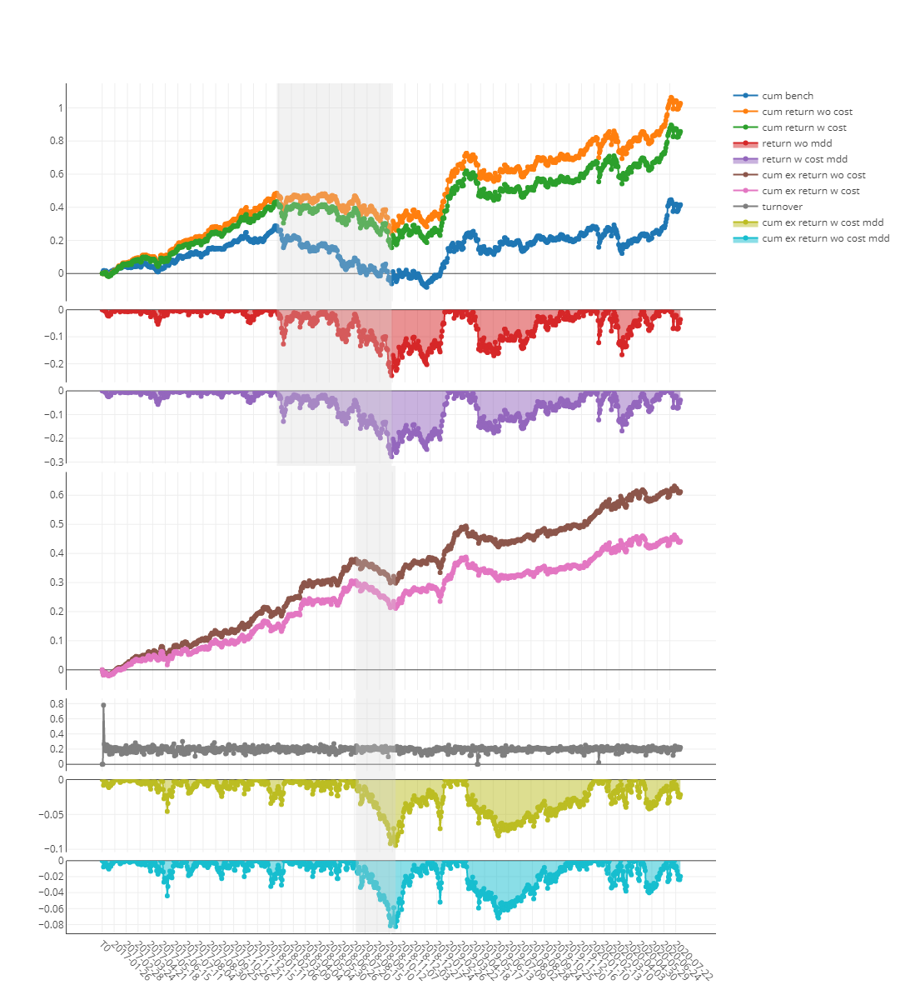

In [9]:
analysis_position.report_graph(report_normal_df)

### risk analysis

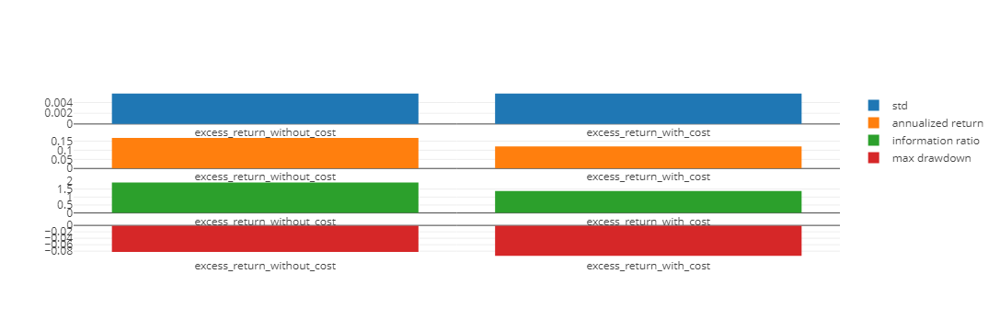

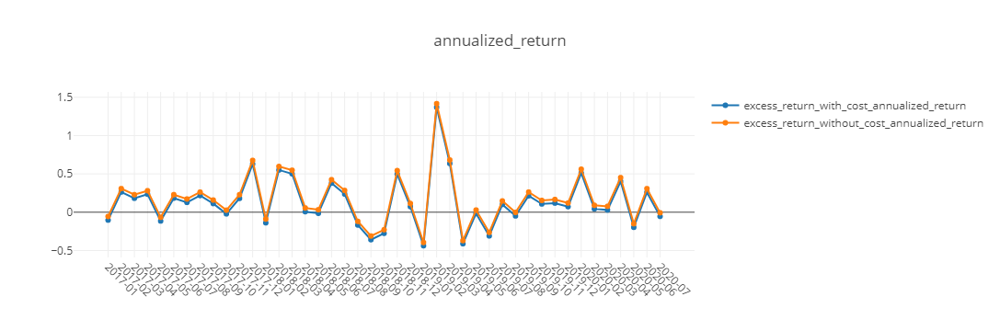

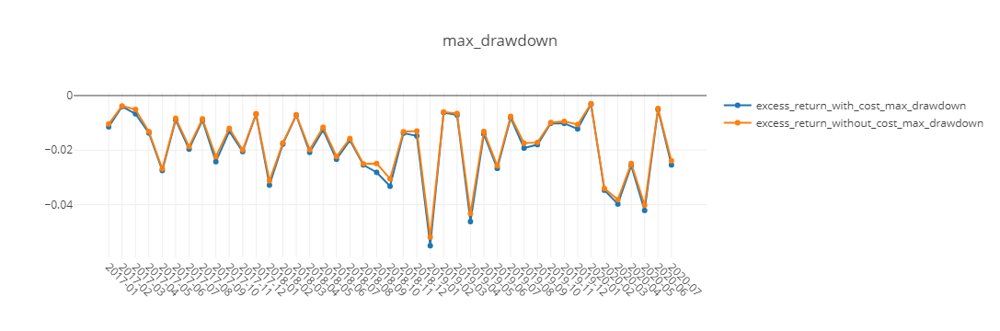

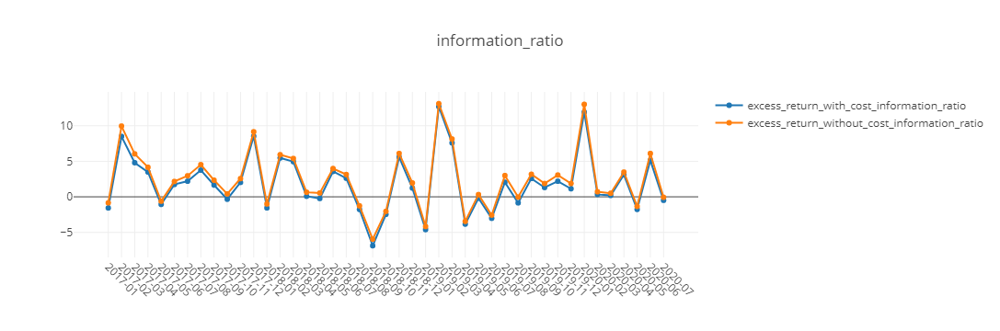

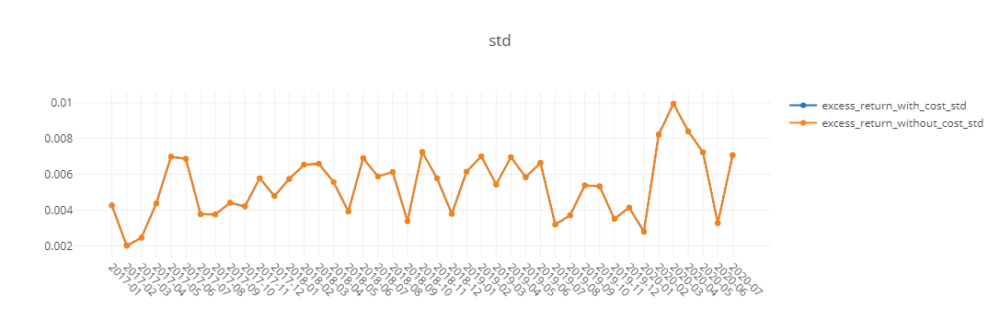

In [10]:
analysis_position.risk_analysis_graph(analysis_df, report_normal_df)

## analysis model

In [11]:
label_df = dataset.prepare("test", col_set="label")
label_df.columns = ['label']

### score IC

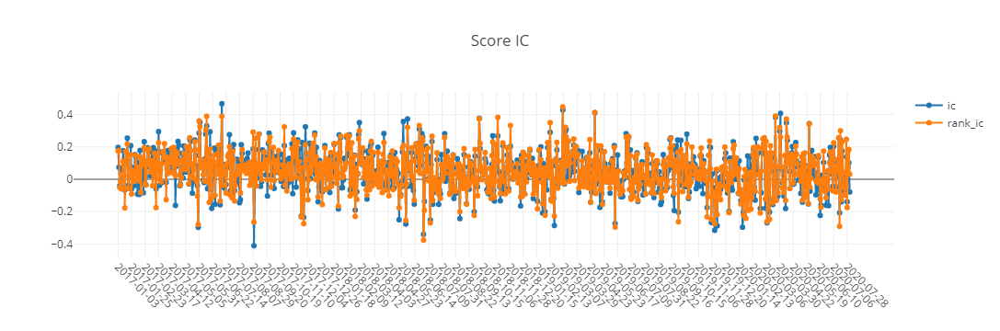

In [14]:
pred_label = pd.concat([label_df, pred_df], axis=1, sort=True).reindex(label_df.index)
analysis_position.score_ic_graph(pred_label)

### model performance

In [ ]:
analysis_model.model_performance_graph(pred_label)